In [1]:
import tensorflow as tf
import keras 
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from tqdm import tqdm
import re
from keras.preprocessing.image import img_to_array

In [2]:

def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
SIZE = 128
_img = []
path = '/kaggle/input/male-and-female-faces-dataset/Male and Female face dataset'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    
    img = cv2.imread(path + '/'+i,1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img = cv2.resize(img, (SIZE, SIZE))
    img = (img - 127.5) / 127.5
    imh = img.astype(float)
    _img.append(img_to_array(img))

 91%|█████████ | 9090/10000 [08:56<00:53, 16.95it/s]


## Visailze our images

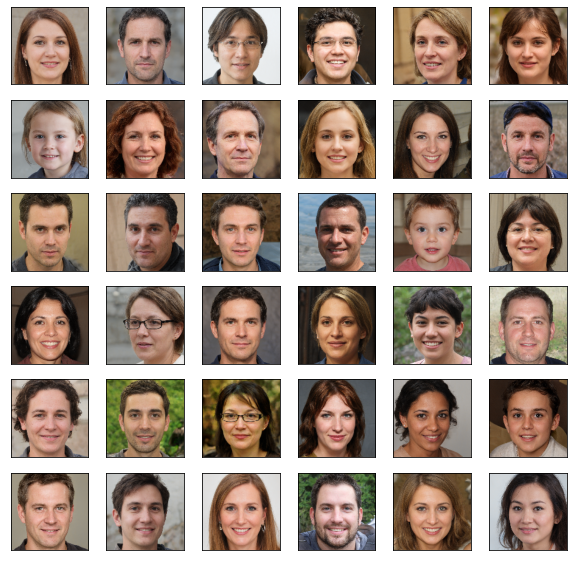

In [36]:
def plot_images(sqr = 5):
    plt.figure(figsize = (10,10))
    plt.title("Real Images",fontsize = 35)
    for i in range(sqr * sqr):
        plt.subplot(sqr,sqr,i+1)
        plt.imshow(_img[i]*0.5 + 0.5 )
        plt.xticks([])
        plt.yticks([])

plot_images(6)
    

In [37]:
batch_size = 32
dataset=tf.data.Dataset.from_tensor_slices(np.array(_img)).batch(batch_size)

In [17]:
latent_dim = 100

inputs = tf.keras.Input(shape=(latent_dim,))
x = layers.Dense(128*128*3, use_bias=False)(inputs)
x = layers.Reshape((128, 128, 3))(x)

# Downsampling
x = layers.Conv2D(128, 4, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.Conv2D(128, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(256, 4, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.Conv2D(256, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

# Upsampling
x = layers.Conv2DTranspose(512, 4, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.Conv2D(512, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2DTranspose(512, 4, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.Conv2DTranspose(512, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2DTranspose(256, 4, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.Conv2DTranspose(256, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2DTranspose(128, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.Conv2DTranspose(128, 4, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.BatchNormalization()(x)
outputs = layers.Conv2DTranspose(3, 4, strides=1, padding='same', activation='tanh')(x)

generator = tf.keras.Model(inputs, outputs)

In [25]:
!apt-get install graphviz

Reading package lists... Done
Building dependency tree       
Reading state information... Done
graphviz is already the newest version (2.40.1-2).
0 upgraded, 0 newly installed, 0 to remove and 21 not upgraded.


In [27]:
generator.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
dense_3 (Dense)              (None, 49152)             4915200   
_________________________________________________________________
reshape (Reshape)            (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 128, 128, 128)     6144      
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 64, 64, 128)       262144    
_________________________________________________________________
batch_normalization_16 (Batc (None, 64, 64, 128)       512       
_________________________________________________________________
leaky_re_lu_20 (LeakyReLU)   (None, 64, 64, 128)       0   

In [67]:

inputs = tf.keras.Input((SIZE, SIZE, 3))
x = layers.Conv2D(128, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(inputs)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(128, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(256, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(256, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(512, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.LeakyReLU()(x)
x = layers.Flatten()(x)
outputs = layers.Dense(1, activation='sigmoid')(x)

discriminator = tf.keras.Model(inputs, outputs)

In [68]:
discriminator.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_45 (Conv2D)           (None, 64, 64, 128)       6144      
_________________________________________________________________
batch_normalization_41 (Batc (None, 64, 64, 128)       512       
_________________________________________________________________
leaky_re_lu_40 (LeakyReLU)   (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_46 (Conv2D)           (None, 32, 32, 128)       262144    
_________________________________________________________________
batch_normalization_42 (Batc (None, 32, 32, 128)       512       
_________________________________________________________________
leaky_re_lu_41 (LeakyReLU)   (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_47 (Conv2D)           (None, 16, 16, 256)      

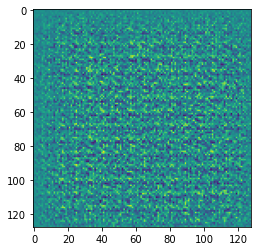

In [69]:
noise = np.random.normal(-1,1,(1,100))
img = generator(noise)
plt.imshow(img[0,:,:,0])
plt.show()

### Defining loss function and optimizer 

In [70]:
optimizer = tf.keras.optimizers.RMSprop(
        lr=.0001,
        clipvalue=1.0,
        decay=1e-8
    )
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits = True)

In [71]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output),fake_output)
def discriminator_loss(fake_output, real_output):
    fake_loss = cross_entropy(tf.zeros_like(fake_output),fake_output)
    real_loss = cross_entropy(tf.ones_like(real_output),real_output)
    return fake_loss + real_loss

In [72]:
def train_steps(images):
    noise = np.random.normal(0,1,(batch_size,latent_dim))
    with tf.GradientTape() as gen_tape , tf.GradientTape() as disc_tape:
        generated_images = generator(noise)
        fake_output = discriminator(generated_images)
        real_output = discriminator(images)
        
        gen_loss = generator_loss(fake_output)
        dis_loss = discriminator_loss(fake_output, real_output)
        
        
    gradient_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)    
    gradient_of_discriminator = disc_tape.gradient(dis_loss, discriminator.trainable_variables)
    
    optimizer.apply_gradients(zip(gradient_of_generator,generator.trainable_variables))
    optimizer.apply_gradients(zip(gradient_of_discriminator, discriminator.trainable_variables))
    
    loss = {'gen loss':gen_loss,
           'disc loss': dis_loss}
    return loss

In [94]:
def plot_generated_images(square = 5, epochs = 0):
    
    
  plt.figure(figsize = (10,10))
  for i in range(square):
#     if epochs != 0:    
#         if(i == square //2):
#             plt.title("Generated Image at Epoch:{}\n".format(epochs), fontsize = 32, color = 'black')
    plt.subplot(square, i, i+1)
    
    noise = np.random.normal(0,1,(1,latent_dim))
    img = generator(noise)
    plt.imshow(np.clip((img[0,...]+1)/2, 0, 1))
    
    plt.xticks([])
    plt.yticks([])
    plt.grid()

In [75]:
import time
from tqdm import tqdm
def train(epochs,dataset):
    
    for epoch in range(epochs):
        start = time.time()
        print("\nEpoch : {}".format(epoch + 1))
        for images in tqdm(dataset):
            loss = train_steps(images)
        print(" Time:{}".format(np.round(time.time() - start),2)) 
        print("Generator Loss: {} Discriminator Loss: {}".format(loss['gen loss'],loss['disc loss']))
            
        

## Training

In [76]:

train(5,dataset)

  0%|          | 0/285 [00:00<?, ?it/s]


Epoch : 1


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 1.1845693588256836 Discriminator Loss: 1.4144365787506104

Epoch : 2


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.23994672298431396 Discriminator Loss: 1.899068832397461

Epoch : 3


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.6290324926376343 Discriminator Loss: 1.4350428581237793

Epoch : 4


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:256.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.4274158775806427 Discriminator Loss: 1.3257830142974854

Epoch : 5


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:256.0
Generator Loss: 1.2475950717926025 Discriminator Loss: 1.136147141456604


# Some Generated Images


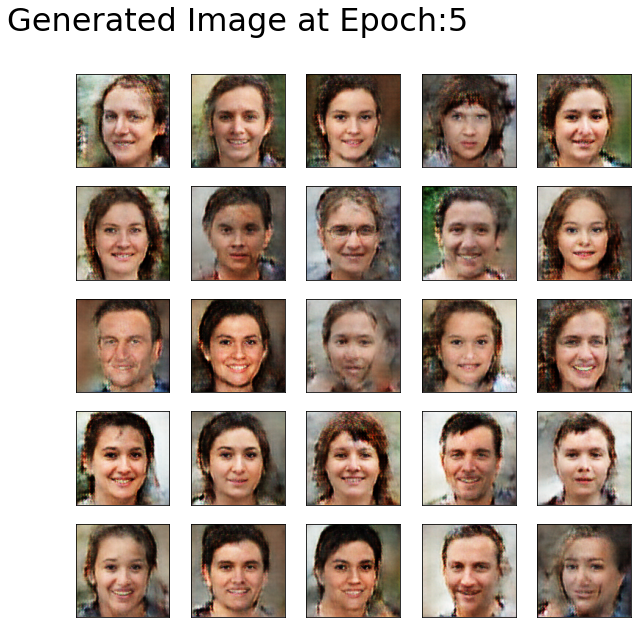

In [82]:
plot_generated_images(square = 5, epochs = 5)

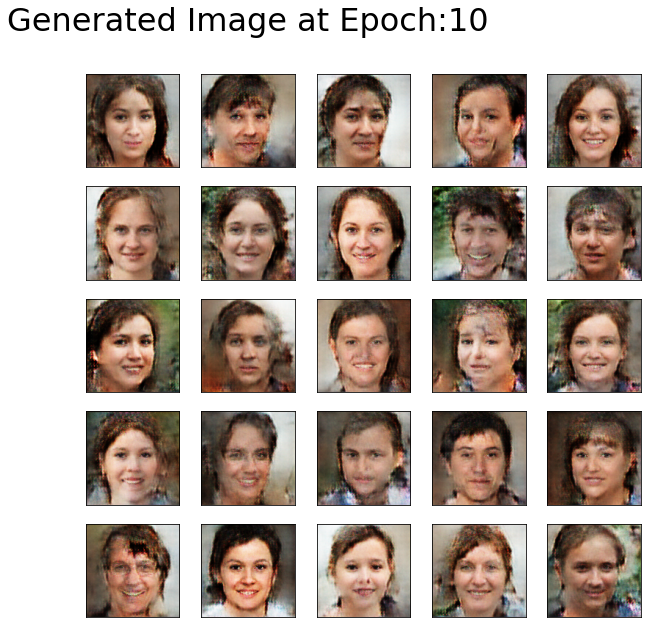

In [83]:
plot_generated_images(square = 5, epochs = 10)

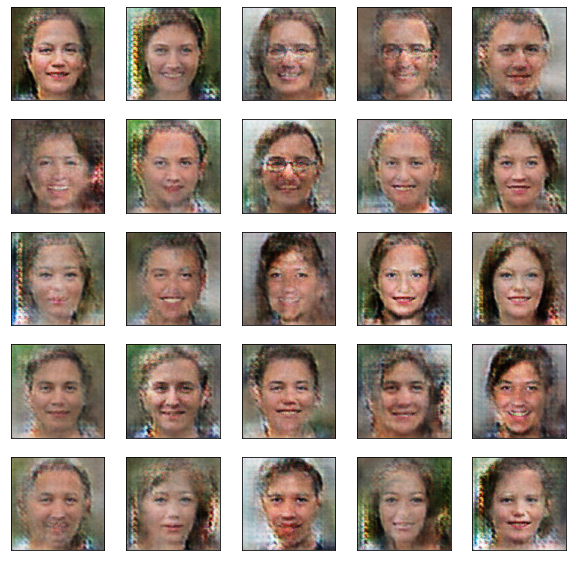

In [79]:

train(5,dataset)
plot_generated_images(10)

  0%|          | 0/285 [00:00<?, ?it/s]


Epoch : 1


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.8979148268699646 Discriminator Loss: 0.8038905262947083

Epoch : 2


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.6311675310134888 Discriminator Loss: 0.8836309313774109

Epoch : 3


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.6068383455276489 Discriminator Loss: 0.9150043725967407

Epoch : 4


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.9629702568054199 Discriminator Loss: 0.6617234349250793

Epoch : 5


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0
Generator Loss: 1.0541380643844604 Discriminator Loss: 0.6200731992721558


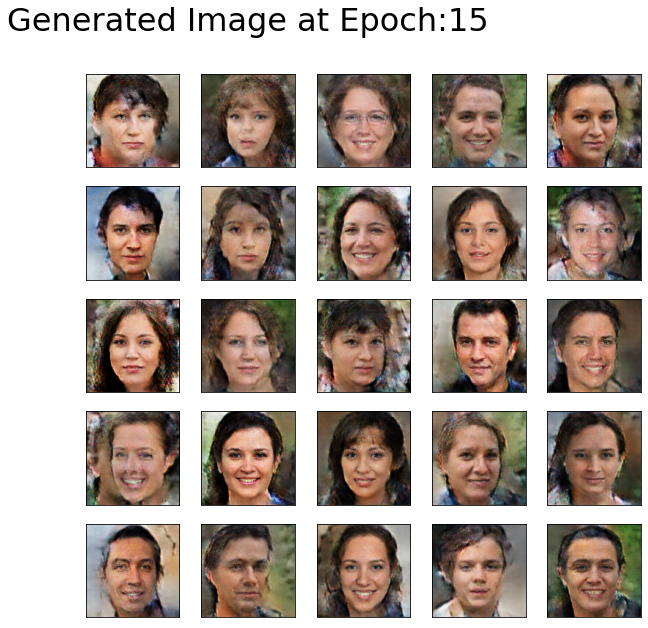

In [85]:
train(5,dataset)
plot_generated_images(square = 5, epochs = 15)

In [86]:
generator.save('generator1.h5')
discriminator.save("discriminator1.h5")

#### ref: <a href = 'https://machinelearningmastery.com/what-are-generative-adversarial-networks-gans/'> machinelearningmastery </a>, <a href = 'https://towardsdatascience.com/generative-adversarial-network-gan-for-dummies-a-step-by-step-tutorial-fdefff170391'> towardsdatascience </a>

In [29]:

train(5,dataset)

  0%|          | 0/285 [00:00<?, ?it/s]


Epoch : 1


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.7153676748275757 Discriminator Loss: 1.0849041938781738

Epoch : 2


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.5954908132553101 Discriminator Loss: 1.0795583724975586

Epoch : 3


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.530248761177063 Discriminator Loss: 1.1120609045028687

Epoch : 4


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.7803083658218384 Discriminator Loss: 0.8787025213241577

Epoch : 5


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0
Generator Loss: 0.5179222226142883 Discriminator Loss: 1.1892420053482056


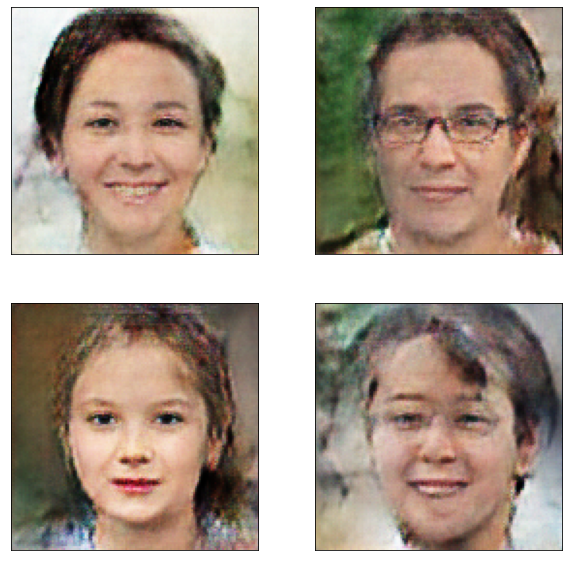

In [30]:
plot_generated_images(2)

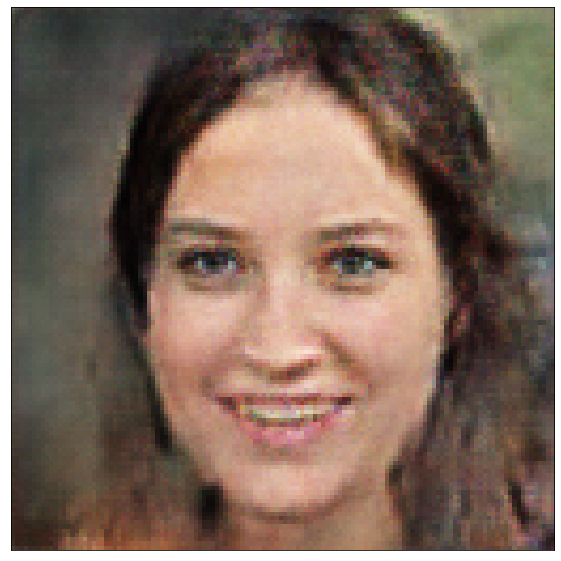

In [31]:
plot_generated_images(1)

In [32]:

train(5,dataset)

  0%|          | 0/285 [00:00<?, ?it/s]


Epoch : 1


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 1.4055835008621216 Discriminator Loss: 0.654775857925415

Epoch : 2


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.6979359984397888 Discriminator Loss: 0.8336679935455322

Epoch : 3


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 1.5192917585372925 Discriminator Loss: 0.5150042772293091

Epoch : 4


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0


  0%|          | 0/285 [00:00<?, ?it/s]

Generator Loss: 0.6865318417549133 Discriminator Loss: 0.8271551132202148

Epoch : 5


100%|██████████| 285/285 [04:15<00:00,  1.12it/s]


 Time:255.0
Generator Loss: 1.2415134906768799 Discriminator Loss: 0.46828290820121765


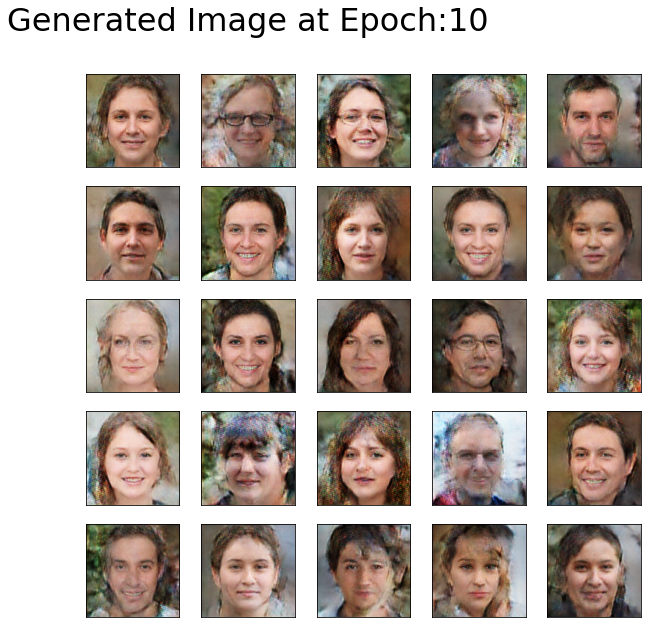

In [38]:
plot_generated_images(square = 5, epochs = 10)

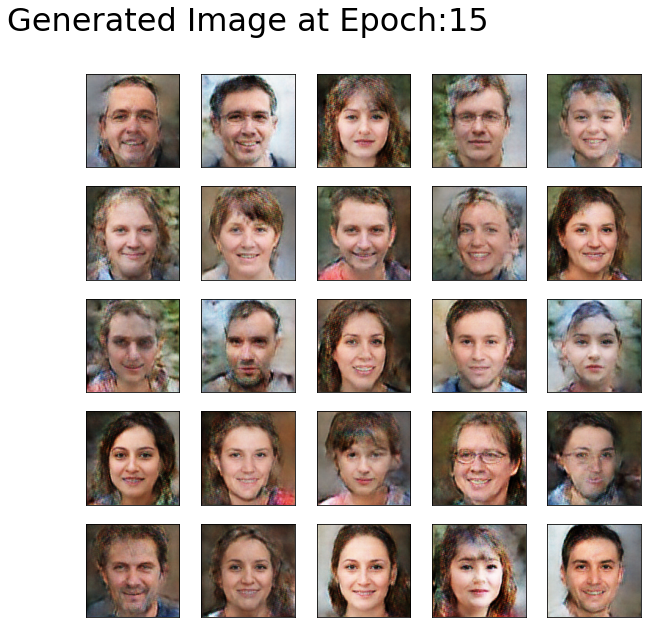

In [36]:
plot_generated_images(square = 5, epochs = 15)

In [35]:
generator.save('generator.h5')
discriminator.save("discriminator.h5")

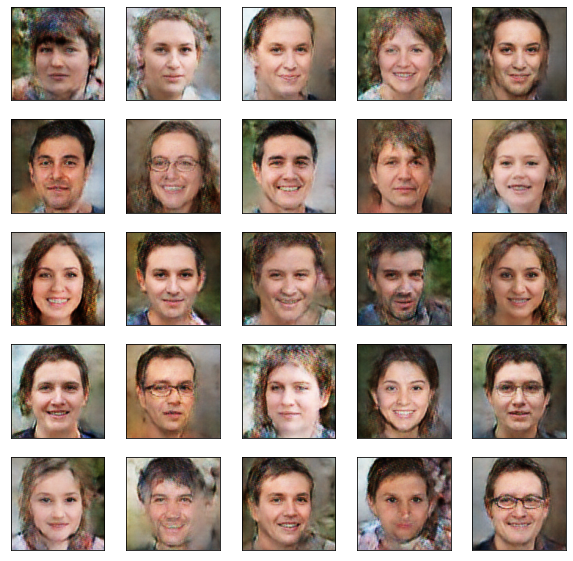

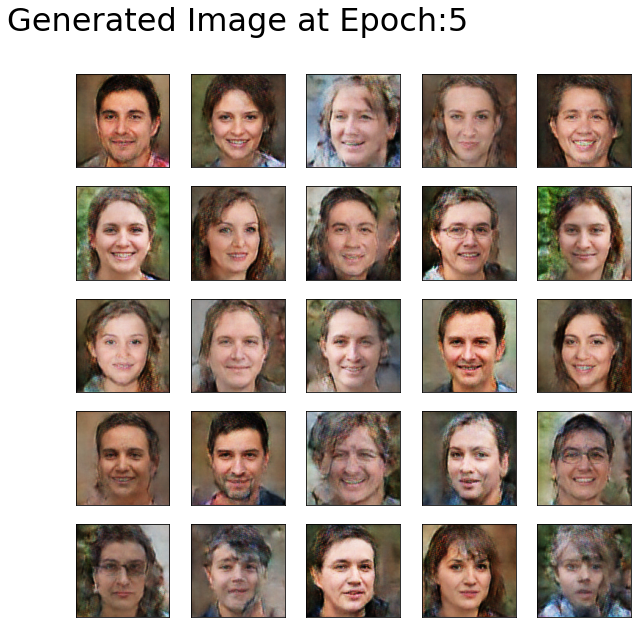

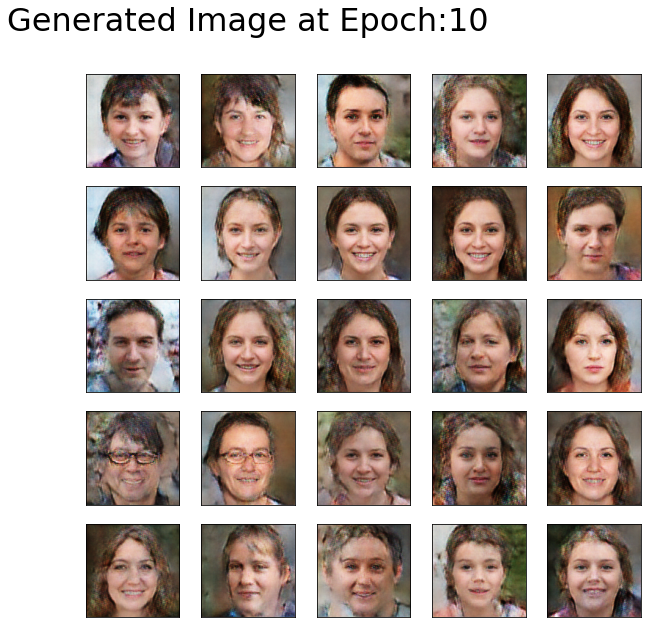

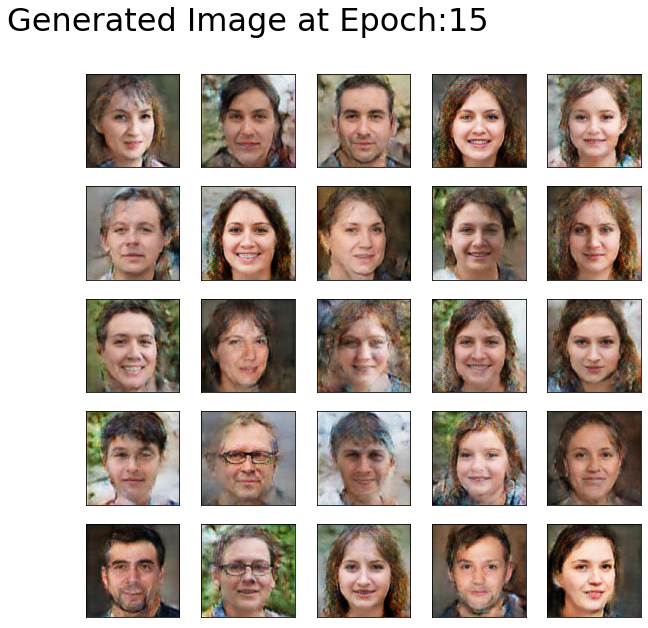

In [39]:
plot_generated_images(square = 5, epochs = 0)
plot_generated_images(square = 5, epochs = 5)
plot_generated_images(square = 5, epochs = 10)
plot_generated_images(square = 5, epochs = 15)


In [40]:
generator.save('generator2.h5')

# Data Augmentation Model

In [8]:
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential

data_augmentation = Sequential([
  preprocessing.RandomFlip("horizontal"),
  preprocessing.RandomRotation(0.1), 
  preprocessing.RandomHeight(0.1), 
  preprocessing.RandomWidth(0.1), 
  preprocessing.RandomZoom(0.1), 
], name="data_augmentation")

In [30]:

inputs = tf.keras.Input((SIZE, SIZE, 3))
x = data_augmentation(inputs)
x = layers.Conv2D(128, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(128, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(256, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(256, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(512, 4, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
x = layers.LeakyReLU()(x)
x = layers.GlobalAveragePooling2D()(x)
outputs = layers.Dense(1, activation='sigmoid')(x)

discriminator = tf.keras.Model(inputs, outputs)

In [31]:
discriminator.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
data_augmentation (Sequentia (None, None, None, 3)     0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, None, None, 128)   6144      
_________________________________________________________________
batch_normalization_21 (Batc (None, None, None, 128)   512       
_________________________________________________________________
leaky_re_lu_24 (LeakyReLU)   (None, None, None, 128)   0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, None, None, 128)   262144    
_________________________________________________________________
batch_normalization_22 (Batc (None, None, None, 128)   512 

In [14]:
def train_steps(images):
    noise = np.random.normal(0,1,(batch_size,latent_dim))
    with tf.GradientTape() as gen_tape , tf.GradientTape() as disc_tape:
        generated_images = generator(noise)
        fake_output = discriminator(generated_images)
        real_output = discriminator(images)
        
        gen_loss = generator_loss(fake_output)
        dis_loss = discriminator_loss(fake_output, real_output)
        
        
    gradient_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)    
    gradient_of_discriminator = disc_tape.gradient(dis_loss, discriminator.trainable_variables)
    
    optimizer.apply_gradients(zip(gradient_of_generator,generator.trainable_variables))
    optimizer.apply_gradients(zip(gradient_of_discriminator, discriminator.trainable_variables))
    
    loss = {'gen loss':gen_loss,
           'disc loss': dis_loss}
    return loss

In [15]:
import time
from tqdm import tqdm
def train(epochs,dataset):
    
    for epoch in range(epochs):
        start = time.time()
        print("\nEpoch : {}".format(epoch + 1))
        for images in tqdm(dataset):
            loss = train_steps(images)
        print(" Time:{}".format(np.round(time.time() - start),2)) 
        print("Generator Loss: {} Discriminator Loss: {}".format(loss['gen loss'],loss['disc loss']))
            
        

In [ ]:

train(15,dataset)

## Results after adding data augmentation layer in discriminator

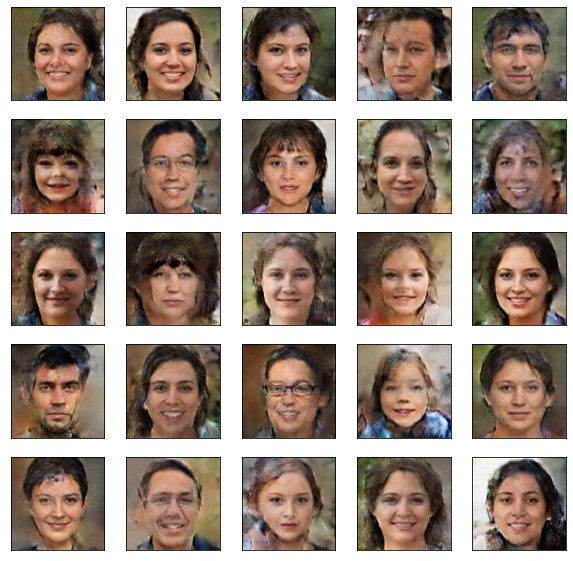

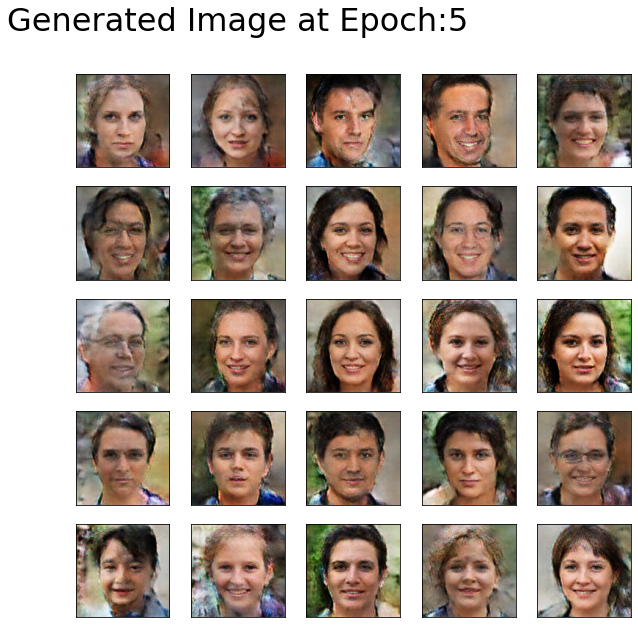

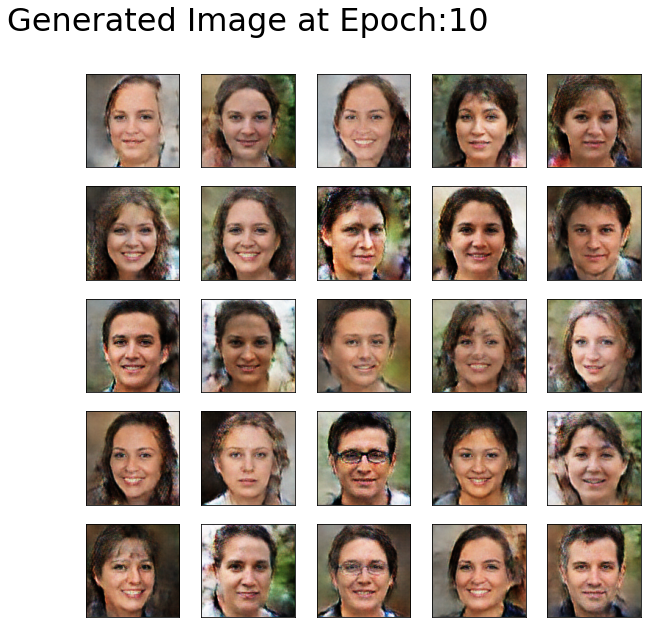

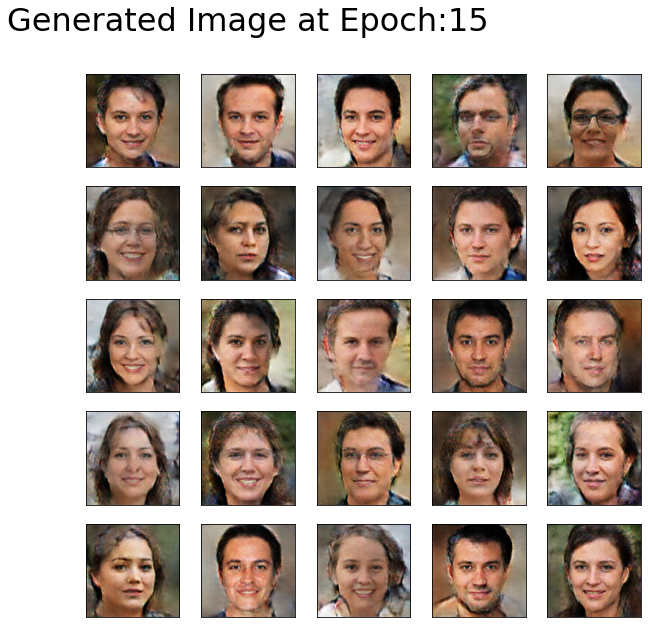

In [90]:
plot_generated_images(square = 5, epochs = 0)
plot_generated_images(square = 5, epochs = 5)
plot_generated_images(square = 5, epochs = 10)
plot_generated_images(square = 5, epochs = 15)
